# **Proyecto Final Seminario 2 de Matemática Aplicada: Clasificación automática de géneros musicales usando aprendizaje supervisado**

Adrían López (21357) | María José Ramírez (221051)

# **Link página streamlit clasificación en tiempo real:** https://proyecto-final---seminario-2.streamlit.app/

# **Link Repositorio Github:** https://github.com/MajoRC221051/Proyecto-Final---Seminario-2

## 1. Preparación de los Datos

### a. Lectura de Librerias:

In [ ]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler

# Modelos
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC

import xgboost as xgb

# Métricas
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix
)

### b. Lectura de Datasets

In [ ]:
from google.colab import files

uploaded = files.upload()

Saving features_30_sec.csv to features_30_sec.csv


In [ ]:
import pandas as pd

df = pd.read_csv("features_30_sec.csv")

# Ver características

In [ ]:
print("Primeras filas:")
display(df.head())

print("\nDimensiones:")
print(df.shape)

print("\nColumnas:")
print(df.columns)

Primeras filas:


,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.wav,661794,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,...,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,blues.00001.wav,661794,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,...,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,blues.00002.wav,661794,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,...,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,blues.00003.wav,661794,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,...,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,blues.00004.wav,661794,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,...,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues



Dimensiones:
(1000, 60)

Columnas:
Index(['filename', 'length', 'chroma_stft_mean', 'chroma_stft_var', 'rms_mean',
       'rms_var', 'spectral_centroid_mean', 'spectral_centroid_var',
       'spectral_bandwidth_mean', 'spectral_bandwidth_var', 'rolloff_mean',
       'rolloff_var', 'zero_crossing_rate_mean', 'zero_crossing_rate_var',
       'harmony_mean', 'harmony_var', 'perceptr_mean', 'perceptr_var', 'tempo',
       'mfcc1_mean', 'mfcc1_var', 'mfcc2_mean', 'mfcc2_var', 'mfcc3_mean',
       'mfcc3_var', 'mfcc4_mean', 'mfcc4_var', 'mfcc5_mean', 'mfcc5_var',
       'mfcc6_mean', 'mfcc6_var', 'mfcc7_mean', 'mfcc7_var', 'mfcc8_mean',
       'mfcc8_var', 'mfcc9_mean', 'mfcc9_var', 'mfcc10_mean', 'mfcc10_var',
       'mfcc11_mean', 'mfcc11_var', 'mfcc12_mean', 'mfcc12_var', 'mfcc13_mean',
       'mfcc13_var', 'mfcc14_mean', 'mfcc14_var', 'mfcc15_mean', 'mfcc15_var',
       'mfcc16_mean', 'mfcc16_var', 'mfcc17_mean', 'mfcc17_var', 'mfcc18_mean',
       'mfcc18_var', 'mfcc19_mean', 'mfcc19_v

### Definición variable objetivo

In [ ]:
y = df['label']

### Limpieza datos

In [ ]:
X = df.drop(['filename', 'label'], axis=1)
y = df['label']

In [ ]:
from sklearn.preprocessing import LabelEncoder

encoder = LabelEncoder()

y_encoded = encoder.fit_transform(y)

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X,
    y_encoded,
    test_size=0.2,
    random_state=42,
    stratify=y_encoded
)

### Escalación

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

### 3. EDA (Análisis exploratorio de Datos)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 60 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   filename                 1000 non-null   object 
 1   length                   1000 non-null   int64  
 2   chroma_stft_mean         1000 non-null   float64
 3   chroma_stft_var          1000 non-null   float64
 4   rms_mean                 1000 non-null   float64
 5   rms_var                  1000 non-null   float64
 6   spectral_centroid_mean   1000 non-null   float64
 7   spectral_centroid_var    1000 non-null   float64
 8   spectral_bandwidth_mean  1000 non-null   float64
 9   spectral_bandwidth_var   1000 non-null   float64
 10  rolloff_mean             1000 non-null   float64
 11  rolloff_var              1000 non-null   float64
 12  zero_crossing_rate_mean  1000 non-null   float64
 13  zero_crossing_rate_var   1000 non-null   float64
 14  harmony_mean             

In [ ]:
df.describe()

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,...,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,662030.846000,0.378682,0.086340,0.130930,0.003051,2201.780898,4.696916e+05,2242.541070,137079.155165,4571.549304,...,1.148144,60.730958,-3.966028,62.633624,0.507696,63.712586,-2.328761,66.231930,-1.095348,70.126096
std,1784.073992,0.081705,0.007735,0.065683,0.003634,715.960600,4.008995e+05,526.316473,96455.666326,1574.791602,...,4.578948,33.781951,4.549697,33.479172,3.869105,34.401977,3.755957,37.174631,3.837007,45.228512
min,660000.000000,0.171939,0.044555,0.005276,0.000004,570.040355,7.911251e+03,898.066208,10787.185064,749.140636,...,-15.693844,9.169314,-17.234728,13.931521,-11.963694,15.420555,-18.501955,13.487622,-19.929634,7.956583
25%,661504.000000,0.319562,0.082298,0.086657,0.000942,1627.697311,1.843505e+05,1907.240605,67376.554428,3380.069642,...,-1.863280,40.376442,-7.207225,40.830875,-2.007015,41.884240,-4.662925,41.710184,-3.368996,42.372865
50%,661794.000000,0.383148,0.086615,0.122443,0.001816,2209.263090,3.384862e+05,2221.392843,111977.548036,4658.524473,...,1.212809,52.325077,-4.065605,54.717674,0.669643,54.804890,-2.393862,57.423059,-1.166289,59.186117
75%,661794.000000,0.435942,0.091256,0.175682,0.003577,2691.294667,6.121479e+05,2578.469836,182371.576801,5533.810460,...,4.359662,71.691755,-0.838737,75.040838,3.119212,75.385832,0.150573,78.626444,1.312615,85.375374
max,675808.000000,0.663685,0.108111,0.397973,0.027679,4435.243901,3.036843e+06,3509.646417,694784.811549,8677.672688,...,13.457150,392.932373,11.482946,406.058868,15.388390,332.905426,14.694924,393.161987,15.369627,506.065155


In [ ]:
df.isnull().sum()

,0
filename,0
length,0
chroma_stft_mean,0
chroma_stft_var,0
rms_mean,0
rms_var,0
spectral_centroid_mean,0
spectral_centroid_var,0
spectral_bandwidth_mean,0
spectral_bandwidth_var,0


#### Distribución features

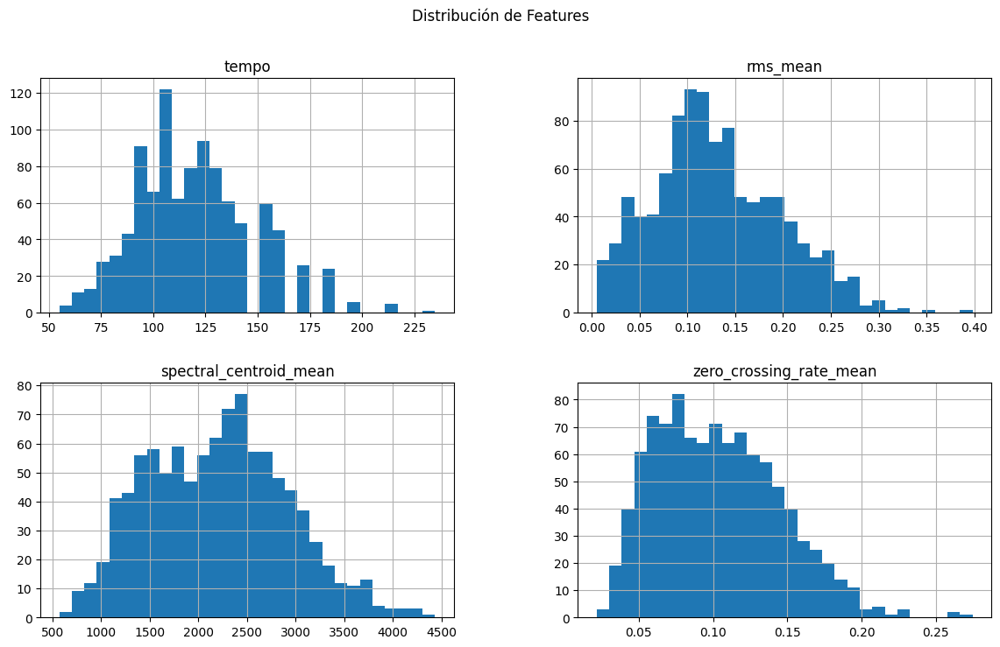

In [ ]:
features = [
    'tempo',
    'rms_mean',
    'spectral_centroid_mean',
    'zero_crossing_rate_mean'
]

df[features].hist(
    figsize=(14,8),
    bins=30
)

plt.suptitle("Distribución de Features")

plt.show()

#### Boxplots por género

/tmp/ipykernel_11655/906611875.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


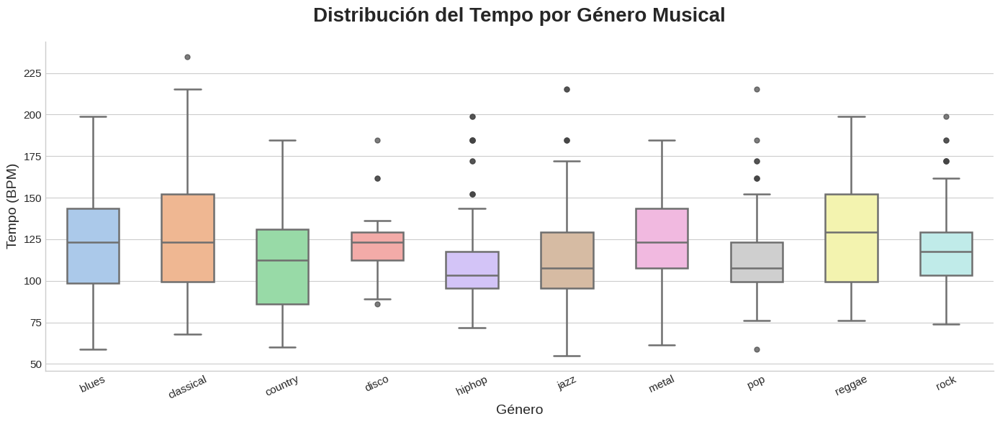

In [ ]:
plt.style.use('seaborn-v0_8-whitegrid')

plt.figure(figsize=(14,6))

sns.boxplot(
    data=df,
    x='label',
    y='tempo',
    palette='pastel',
    width=0.55,
    linewidth=1.8,
    showfliers=True,
    flierprops={
        'marker': 'o',
        'markerfacecolor': '#444444',
        'markeredgecolor': '#444444',
        'markersize': 5,
        'alpha': 0.7
    }
)

plt.title(
    "Distribución del Tempo por Género Musical",
    fontsize=20,
    fontweight='bold',
    pad=20
)

plt.xlabel(
    "Género",
    fontsize=14
)

plt.ylabel(
    "Tempo (BPM)",
    fontsize=14
)

plt.xticks(
    rotation=25,
    fontsize=11
)

plt.yticks(fontsize=11)

sns.despine()

plt.tight_layout()

plt.show()

#### Correlación

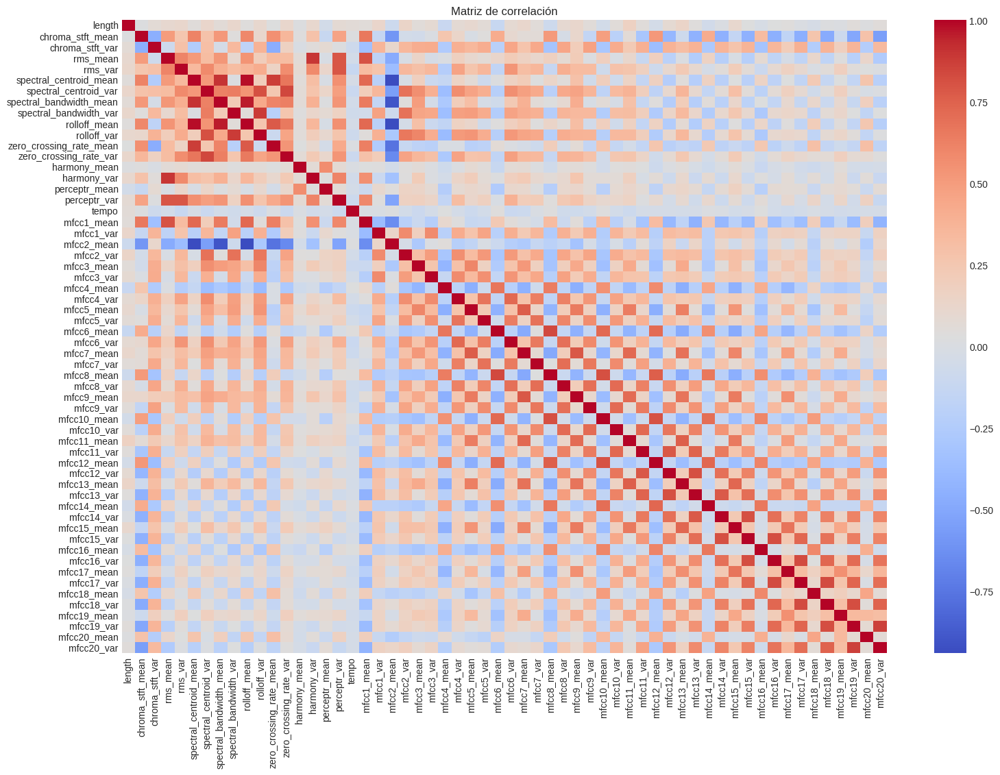

In [ ]:
corr = X.corr()

plt.figure(figsize=(18,12))

sns.heatmap(
    corr,
    cmap='coolwarm'
)

plt.title("Matriz de correlación")

plt.show()

### PCA (Exploratorio)

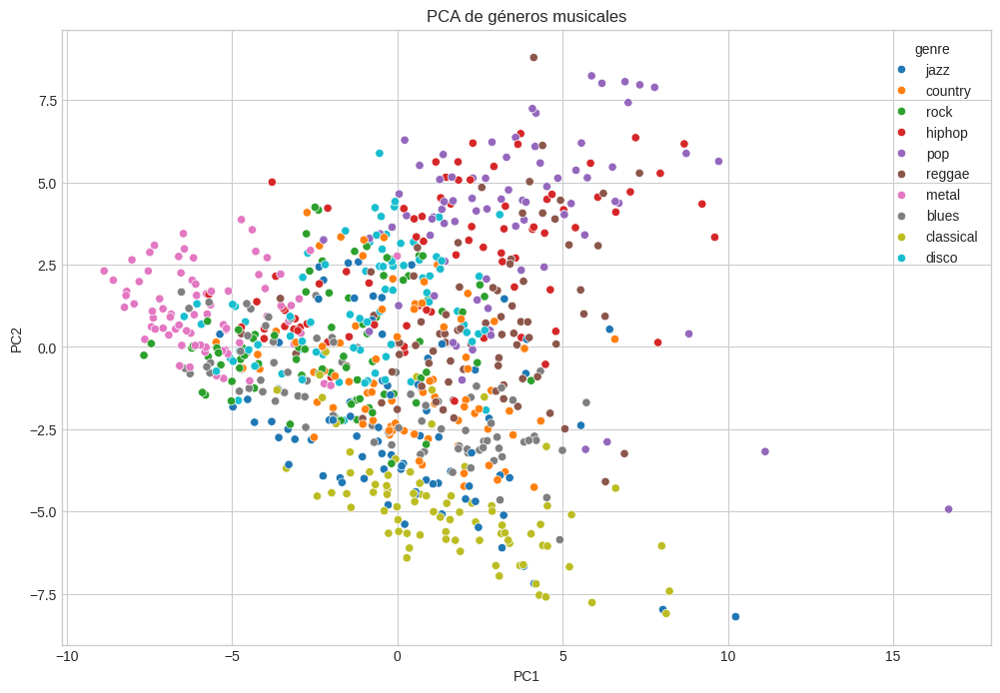

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)

X_pca = pca.fit_transform(X_train_scaled)

pca_df = pd.DataFrame({
    'PC1': X_pca[:,0],
    'PC2': X_pca[:,1],
    'genre': encoder.inverse_transform(y_train)
})

plt.figure(figsize=(12,8))

sns.scatterplot(
    data=pca_df,
    x='PC1',
    y='PC2',
    hue='genre',
    palette='tab10'
)

plt.title("PCA de géneros musicales")

plt.show()

#### Pairplot

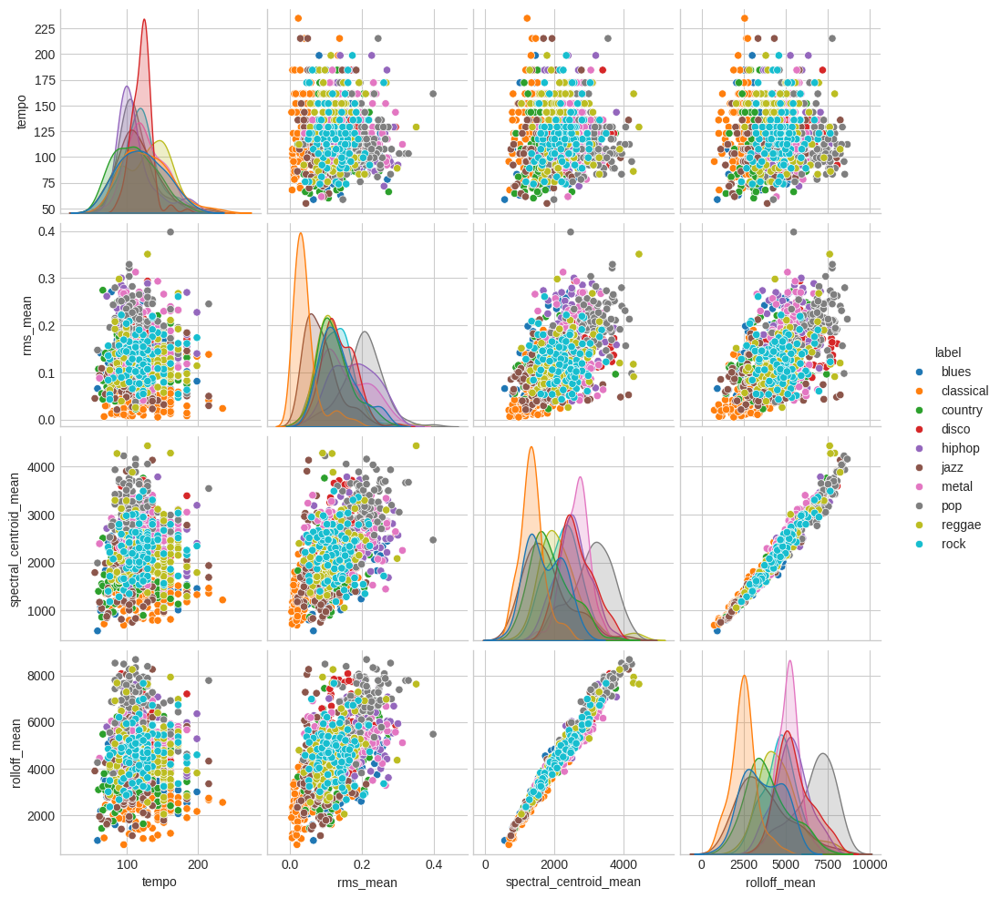

In [ ]:
selected = [
    'tempo',
    'rms_mean',
    'spectral_centroid_mean',
    'rolloff_mean',
    'label'
]

sns.pairplot(
    df[selected],
    hue='label'
)

plt.show()

## **Aprendizaje estadístico y Modelado**

# Random Forest

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import (
    train_test_split, StratifiedKFold,
    RandomizedSearchCV, cross_val_score
)
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import (
    classification_report, confusion_matrix,
    ConfusionMatrixDisplay, roc_auc_score,
    balanced_accuracy_score
)
from sklearn.inspection import permutation_importance
from sklearn.calibration import CalibratedClassifierCV, calibration_curve
from scipy.stats import randint

In [ ]:
encoder = LabelEncoder().fit(df['label'])
y = encoder.transform(df['label'])

X = df.drop(['filename', 'label', 'length'], axis=1)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,
    random_state=42,
    stratify=y          # keeps class proportions in both sets
)

print(f"Train size: {X_train.shape}, Test size: {X_test.shape}")

Train size: (800, 57), Test size: (200, 57)


In [ ]:
param_dist = {
    'n_estimators':      randint(100, 300),
    'max_depth':         [4],
    'min_samples_split': randint(5,20),
    'min_samples_leaf':  randint(3,10),
    'max_features':      ['sqrt', 'log2', 0.3, 0.5],
    'bootstrap':         [True],
    'oob_score':         [True],
}

base_rf = RandomForestClassifier(
    class_weight='balanced',
    random_state=42,
    n_jobs=-1
)

cv_inner = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

search = RandomizedSearchCV(
    base_rf,
    param_distributions=param_dist,
    n_iter=50,                    # raise to 100 for production
    cv=cv_inner,
    scoring='balanced_accuracy',
    n_jobs=-1,
    random_state=42,
    verbose=1,
    refit=True
)
search.fit(X_train, y_train)

rf_best = search.best_estimator_

print(f"Best params:       {search.best_params_}")
print(f"Best CV score:     {search.best_score_:.4f}")
#print(f"OOB score:         {rf_best.oob_score_:.4f}")

Fitting 3 folds for each of 50 candidates, totalling 150 fits
Best params:       {'bootstrap': True, 'max_depth': 4, 'max_features': 0.3, 'min_samples_leaf': 8, 'min_samples_split': 5, 'n_estimators': 263, 'oob_score': True}
Best CV score:     0.6031


In [ ]:
cv_outer = StratifiedKFold(n_splits=3, shuffle=True, random_state=0)

cv_scores = cross_val_score(
    rf_best, X_train, y_train,
    cv=cv_outer,
    scoring='balanced_accuracy',
    n_jobs=-1
)

print(f"3-Fold CV  →  {cv_scores.mean():.4f} ± {cv_scores.std():.4f}")

3-Fold CV  →  0.5987 ± 0.0325


In [ ]:
y_pred  = rf_best.predict(X_test)
y_proba = rf_best.predict_proba(X_test)

print("=== Classification Report ===")
print(classification_report(y_test, y_pred, target_names=encoder.classes_))
print(f"Balanced Accuracy : {balanced_accuracy_score(y_test, y_pred):.4f}")

# Multi-class AUC
if len(encoder.classes_) > 2:
    auc = roc_auc_score(y_test, y_proba, multi_class='ovr', average='weighted')
else:
    auc = roc_auc_score(y_test, y_proba[:, 1])

print(f"Weighted ROC-AUC  : {auc:.4f}")

=== Classification Report ===
              precision    recall  f1-score   support

       blues       0.64      0.45      0.53        20
   classical       0.82      0.90      0.86        20
     country       0.69      0.45      0.55        20
       disco       0.36      0.25      0.29        20
      hiphop       0.43      0.45      0.44        20
        jazz       0.52      0.65      0.58        20
       metal       0.57      0.85      0.68        20
         pop       0.61      0.70      0.65        20
      reggae       0.42      0.50      0.45        20
        rock       0.29      0.20      0.24        20

    accuracy                           0.54       200
   macro avg       0.53      0.54      0.53       200
weighted avg       0.53      0.54      0.53       200

Balanced Accuracy : 0.5400
Weighted ROC-AUC  : 0.9159


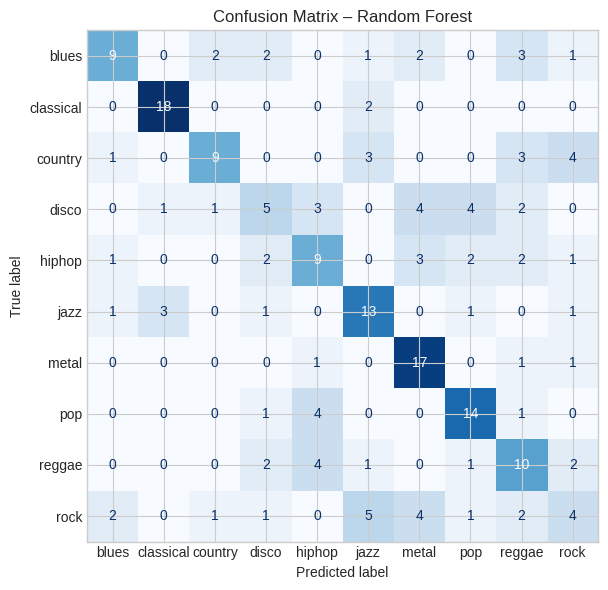

In [ ]:
fig, ax = plt.subplots(figsize=(8, 6))

ConfusionMatrixDisplay.from_predictions(
    y_test, y_pred,
    display_labels=encoder.classes_,
    cmap='Blues',
    ax=ax,
    colorbar=False
)

ax.set_title("Confusion Matrix – Random Forest")
plt.tight_layout()
plt.show()

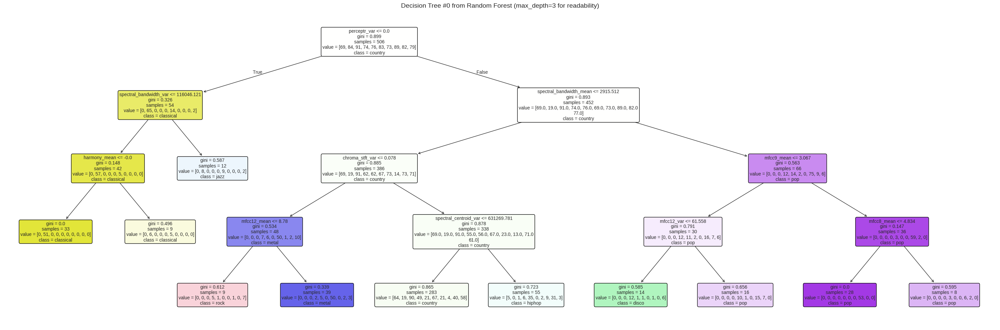

In [ ]:
from sklearn.tree import plot_tree

fig, ax = plt.subplots(figsize=(30, 10))

plot_tree(
    rf_best.estimators_[0],   # first tree in the forest
    feature_names=list(X.columns),
    class_names=list(encoder.classes_),
    filled=True,              # color nodes by majority class
    rounded=True,
    max_depth=22,              # keep it readable — full tree is huge
    fontsize=10,
    ax=ax
)

plt.title("Decision Tree #0 from Random Forest (max_depth=3 for readability)", fontsize=14)
plt.tight_layout()
plt.show()

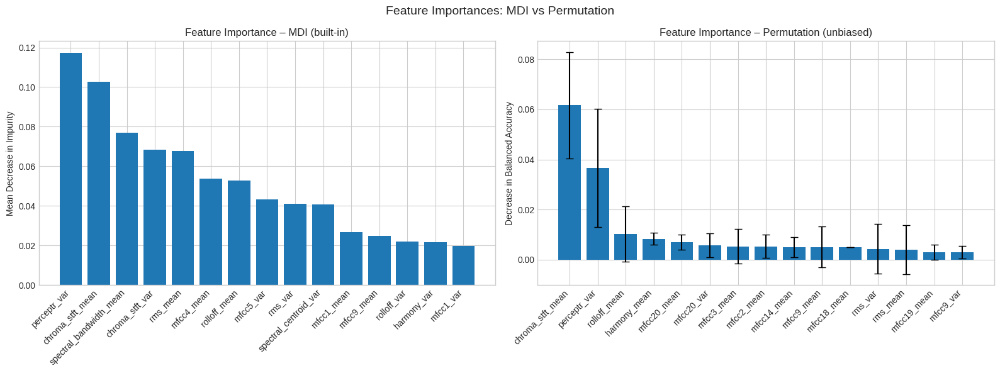

In [ ]:
# Built-in MDI importance
importances_mdi = rf_best.feature_importances_
idx_mdi = np.argsort(importances_mdi)[::-1][:15]

# Permutation importance (unbiased)
perm = permutation_importance(
    rf_best, X_test, y_test,
    n_repeats=15,
    random_state=42,
    n_jobs=-1,
    scoring='balanced_accuracy'
)
idx_perm = np.argsort(perm.importances_mean)[::-1][:15]

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

axes[0].bar(range(15), importances_mdi[idx_mdi])
axes[0].set_xticks(range(15))
axes[0].set_xticklabels([X.columns[i] for i in idx_mdi], rotation=45, ha='right')
axes[0].set_title("Feature Importance – MDI (built-in)")
axes[0].set_ylabel("Mean Decrease in Impurity")

axes[1].bar(range(15), perm.importances_mean[idx_perm],
            yerr=perm.importances_std[idx_perm], capsize=4)
axes[1].set_xticks(range(15))
axes[1].set_xticklabels([X.columns[i] for i in idx_perm], rotation=45, ha='right')
axes[1].set_title("Feature Importance – Permutation (unbiased)")
axes[1].set_ylabel("Decrease in Balanced Accuracy")

plt.suptitle("Feature Importances: MDI vs Permutation", fontsize=14)
plt.tight_layout()
plt.show()

In [ ]:


import numpy as np
import pandas as pd

def eliminar_colinealidad(df_features, umbral=0.85):
    # 1. Matriz de correlación absoluta
    corr_matrix = df_features.corr().abs()

    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))


    to_drop = [column for column in upper.columns if any(upper[column] > umbral)]

    print(f"Se eliminarán {len(to_drop)} variables por colinealidad (r > {umbral})")

    # 4. Reduced matrix
    return df_features.drop(columns=to_drop)

X_limpio = eliminar_colinealidad(X, umbral=0.85)

Se eliminarán 7 variables por colinealidad (r > 0.85)


# Decision Tree

Decision Tree Accuracy:
0.49

Classification Report:

              precision    recall  f1-score   support

       blues       0.50      0.35      0.41        20
   classical       0.71      0.85      0.77        20
     country       0.50      0.25      0.33        20
       disco       0.27      0.40      0.32        20
      hiphop       0.48      0.60      0.53        20
        jazz       0.52      0.60      0.56        20
       metal       0.82      0.70      0.76        20
         pop       0.71      0.50      0.59        20
      reggae       0.31      0.25      0.28        20
        rock       0.30      0.40      0.34        20

    accuracy                           0.49       200
   macro avg       0.51      0.49      0.49       200
weighted avg       0.51      0.49      0.49       200



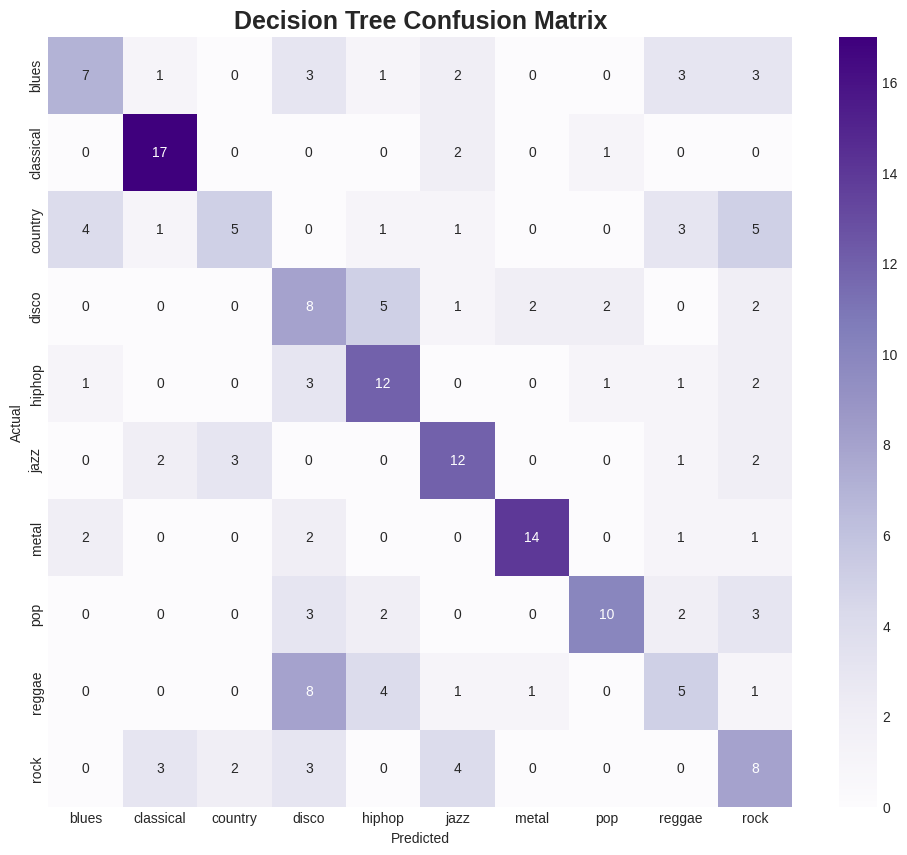

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix
)

# Decision Tree model
dt_model = DecisionTreeClassifier(
    criterion='gini',
    max_depth=10,
    random_state=42
)

# Train model
dt_model.fit(
    X_train,
    y_train
)

# Predictions
dt_pred = dt_model.predict(X_test)

# Evaluation
dt_acc = accuracy_score(
    y_test,
    dt_pred
)

print("Decision Tree Accuracy:")
print(dt_acc)

print("\nClassification Report:\n")

print(
    classification_report(
        y_test,
        dt_pred,
        target_names=encoder.classes_
    )
)

# Confusion matrix
cm = confusion_matrix(
    y_test,
    dt_pred
)

plt.figure(figsize=(12,10))

sns.heatmap(
    cm,
    annot=True,
    fmt='d',
    cmap='Purples',
    xticklabels=encoder.classes_,
    yticklabels=encoder.classes_
)

plt.title(
    "Decision Tree Confusion Matrix",
    fontsize=18,
    fontweight='bold'
)

plt.xlabel("Predicted")
plt.ylabel("Actual")

plt.show()

In [ ]:
!pip install graphviz

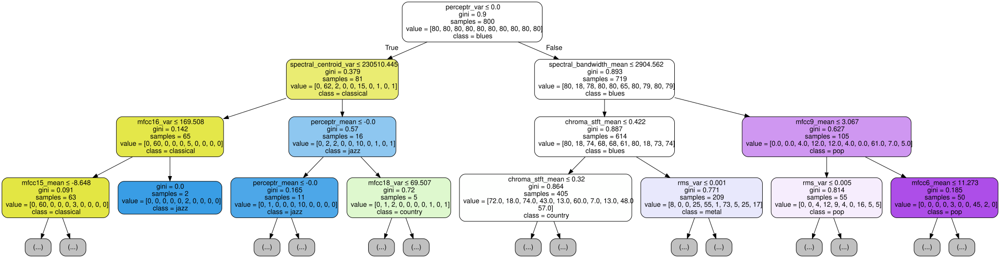

In [ ]:
#Tree visualization

from sklearn.tree import export_graphviz
import graphviz

dot_data = export_graphviz(
    dt_model,
    out_file=None,
    feature_names=X.columns,
    class_names=encoder.classes_,
    filled=True,
    rounded=True,
    special_characters=True,
    max_depth=3
)

graph = graphviz.Source(dot_data)

graph

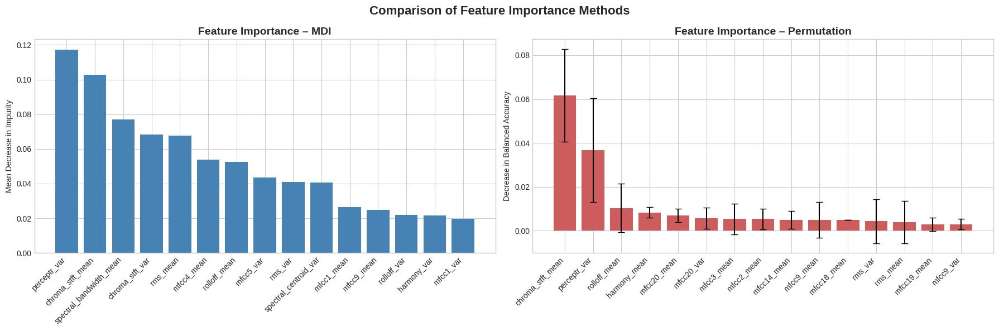

In [ ]:
fig, axes = plt.subplots(
    1, 2,
    figsize=(18,6)
)

# MDI importance
axes[0].bar(
    range(15),
    importances_mdi[idx_mdi],
    color='steelblue'
)

axes[0].set_xticks(range(15))

axes[0].set_xticklabels(
    [X.columns[i] for i in idx_mdi],
    rotation=45,
    ha='right'
)

axes[0].set_title(
    "Feature Importance – MDI",
    fontsize=14,
    fontweight='bold'
)

axes[0].set_ylabel(
    "Mean Decrease in Impurity"
)

# Permutation importance
axes[1].bar(
    range(15),
    perm.importances_mean[idx_perm],
    yerr=perm.importances_std[idx_perm],
    capsize=4,
    color='indianred'
)

axes[1].set_xticks(range(15))

axes[1].set_xticklabels(
    [X.columns[i] for i in idx_perm],
    rotation=45,
    ha='right'
)

axes[1].set_title(
    "Feature Importance – Permutation",
    fontsize=14,
    fontweight='bold'
)

axes[1].set_ylabel(
    "Decrease in Balanced Accuracy"
)

plt.suptitle(
    "Comparison of Feature Importance Methods",
    fontsize=16,
    fontweight='bold'
)

plt.tight_layout()

plt.show()

#XG-BOOST

XGBoost Accuracy:
0.73

Classification Report:

              precision    recall  f1-score   support

       blues       0.65      0.75      0.70        20
   classical       0.95      0.95      0.95        20
     country       0.67      0.80      0.73        20
       disco       0.60      0.45      0.51        20
      hiphop       0.59      0.80      0.68        20
        jazz       0.78      0.90      0.84        20
       metal       1.00      0.75      0.86        20
         pop       0.85      0.85      0.85        20
      reggae       0.68      0.65      0.67        20
        rock       0.57      0.40      0.47        20

    accuracy                           0.73       200
   macro avg       0.73      0.73      0.73       200
weighted avg       0.73      0.73      0.73       200



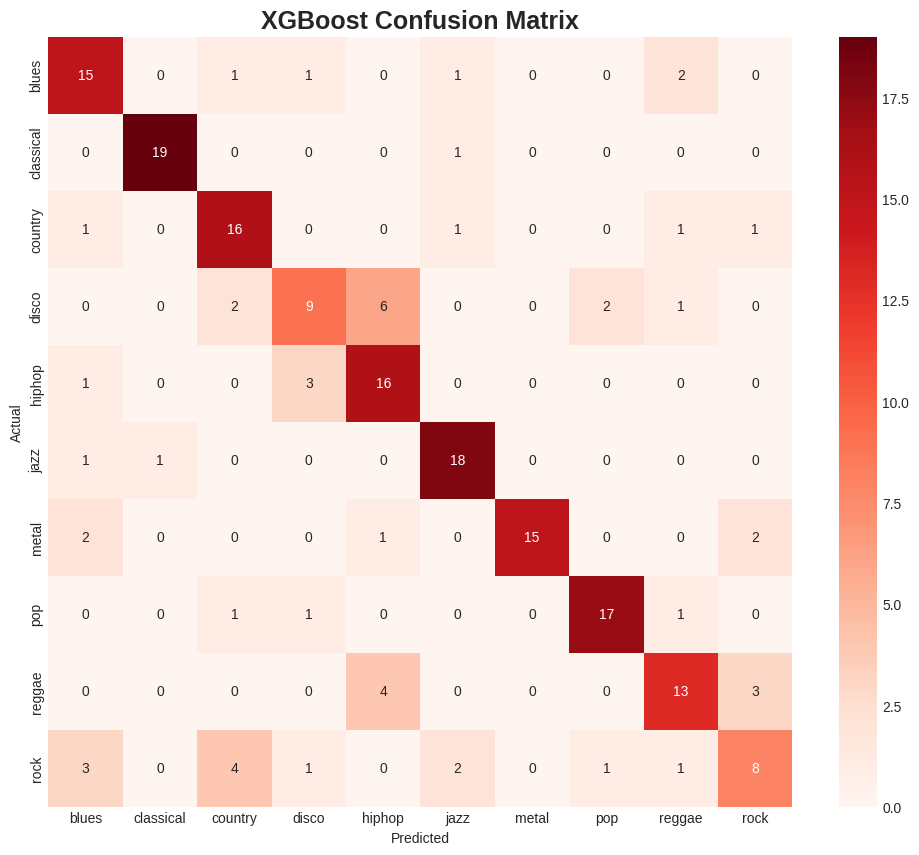

In [ ]:
import xgboost as xgb

from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix
)

# XGBoost model
xgb_model = xgb.XGBClassifier(
    objective='multi:softmax',
    num_class=len(encoder.classes_),
    n_estimators=200,
    max_depth=6,
    learning_rate=0.05,
    subsample=0.8,
    colsample_bytree=0.8,
    eval_metric='mlogloss',
    random_state=42
)

# Train model
xgb_model.fit(
    X_train,
    y_train
)

# Predictions
xgb_pred = xgb_model.predict(X_test)

# Evaluation
xgb_acc = accuracy_score(
    y_test,
    xgb_pred
)

print("XGBoost Accuracy:")
print(xgb_acc)

print("\nClassification Report:\n")

print(
    classification_report(
        y_test,
        xgb_pred,
        target_names=encoder.classes_
    )
)

# Confusion matrix
cm = confusion_matrix(
    y_test,
    xgb_pred
)

plt.figure(figsize=(12,10))

sns.heatmap(
    cm,
    annot=True,
    fmt='d',
    cmap='Reds',
    xticklabels=encoder.classes_,
    yticklabels=encoder.classes_
)

plt.title(
    "XGBoost Confusion Matrix",
    fontsize=18,
    fontweight='bold'
)

plt.xlabel("Predicted")
plt.ylabel("Actual")

plt.show()

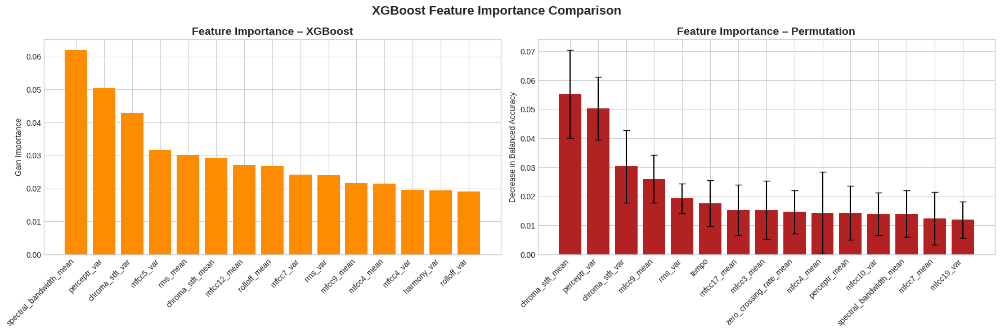

In [ ]:
from sklearn.inspection import permutation_importance

# Built-in XGBoost importance
xgb_importances = xgb_model.feature_importances_

idx_xgb = np.argsort(
    xgb_importances
)[::-1][:15]

# Permutation importance
xgb_perm = permutation_importance(
    xgb_model,
    X_test,
    y_test,
    n_repeats=15,
    random_state=42,
    n_jobs=-1,
    scoring='balanced_accuracy'
)

idx_perm = np.argsort(
    xgb_perm.importances_mean
)[::-1][:15]

fig, axes = plt.subplots(
    1, 2,
    figsize=(18,6)
)

# Built-in importance
axes[0].bar(
    range(15),
    xgb_importances[idx_xgb],
    color='darkorange'
)

axes[0].set_xticks(range(15))

axes[0].set_xticklabels(
    [X.columns[i] for i in idx_xgb],
    rotation=45,
    ha='right'
)

axes[0].set_title(
    "Feature Importance – XGBoost",
    fontsize=14,
    fontweight='bold'
)

axes[0].set_ylabel(
    "Gain Importance"
)

# Permutation importance
axes[1].bar(
    range(15),
    xgb_perm.importances_mean[idx_perm],
    yerr=xgb_perm.importances_std[idx_perm],
    capsize=4,
    color='firebrick'
)

axes[1].set_xticks(range(15))

axes[1].set_xticklabels(
    [X.columns[i] for i in idx_perm],
    rotation=45,
    ha='right'
)

axes[1].set_title(
    "Feature Importance – Permutation",
    fontsize=14,
    fontweight='bold'
)

axes[1].set_ylabel(
    "Decrease in Balanced Accuracy"
)

plt.suptitle(
    "XGBoost Feature Importance Comparison",
    fontsize=16,
    fontweight='bold'
)

plt.tight_layout()

plt.show()

# Naive-Bayes

Naive Bayes Accuracy:
0.53

Classification Report:

              precision    recall  f1-score   support

       blues       0.33      0.70      0.45        20
   classical       0.83      0.95      0.88        20
     country       0.30      0.15      0.20        20
       disco       0.40      0.30      0.34        20
      hiphop       0.56      0.50      0.53        20
        jazz       0.75      0.45      0.56        20
       metal       0.48      0.75      0.59        20
         pop       0.86      0.95      0.90        20
      reggae       0.53      0.45      0.49        20
        rock       0.20      0.10      0.13        20

    accuracy                           0.53       200
   macro avg       0.52      0.53      0.51       200
weighted avg       0.52      0.53      0.51       200



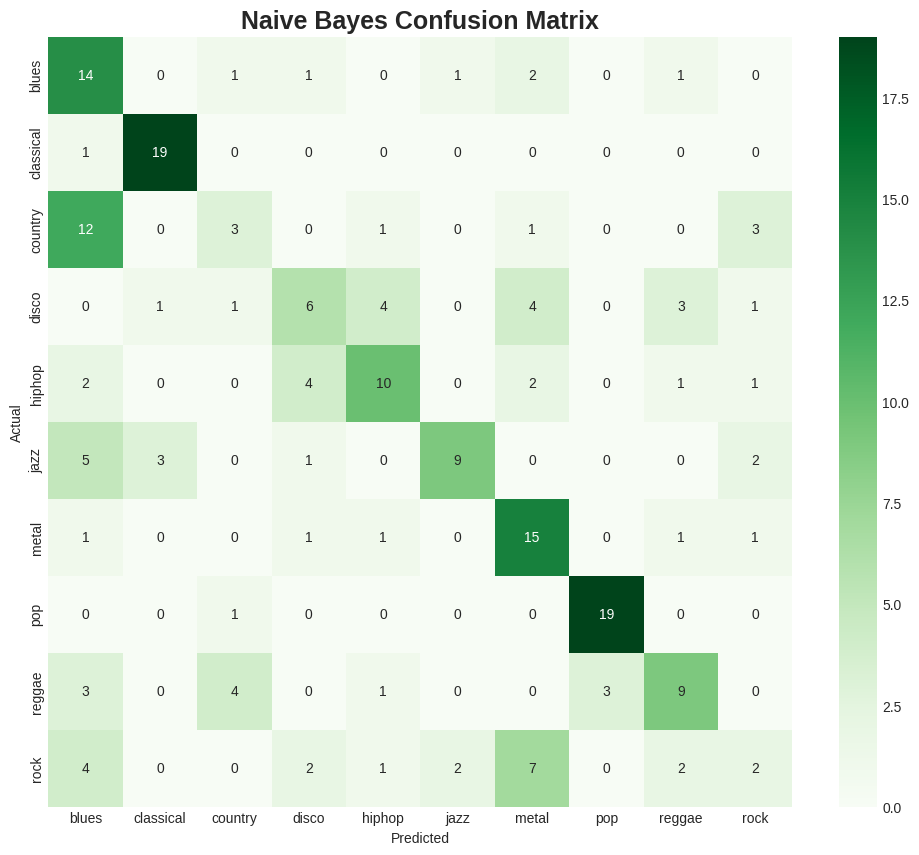

In [ ]:
from sklearn.naive_bayes import GaussianNB

from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix
)

# Naive Bayes model
nb_model = GaussianNB()

# Train model
nb_model.fit(
    X_train_scaled,
    y_train
)

# Predictions
nb_pred = nb_model.predict(
    X_test_scaled
)

# Evaluation
nb_acc = accuracy_score(
    y_test,
    nb_pred
)

print("Naive Bayes Accuracy:")
print(nb_acc)

print("\nClassification Report:\n")

print(
    classification_report(
        y_test,
        nb_pred,
        target_names=encoder.classes_
    )
)

# Confusion matrix
cm = confusion_matrix(
    y_test,
    nb_pred
)

plt.figure(figsize=(12,10))

sns.heatmap(
    cm,
    annot=True,
    fmt='d',
    cmap='Greens',
    xticklabels=encoder.classes_,
    yticklabels=encoder.classes_
)

plt.title(
    "Naive Bayes Confusion Matrix",
    fontsize=18,
    fontweight='bold'
)

plt.xlabel("Predicted")
plt.ylabel("Actual")

plt.show()

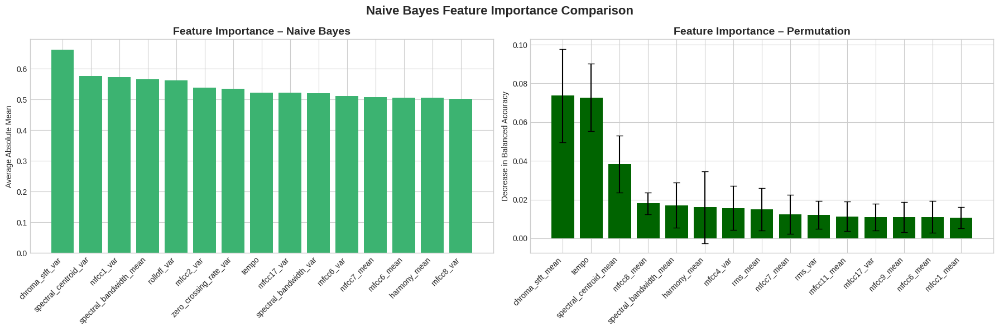

In [ ]:
from sklearn.inspection import permutation_importance

# Naive Bayes feature importance
nb_importances = np.abs(
    nb_model.theta_
).mean(axis=0)

idx_nb = np.argsort(
    nb_importances
)[::-1][:15]

# Permutation importance
nb_perm = permutation_importance(
    nb_model,
    X_test_scaled,
    y_test,
    n_repeats=15,
    random_state=42,
    n_jobs=-1,
    scoring='balanced_accuracy'
)

idx_perm = np.argsort(
    nb_perm.importances_mean
)[::-1][:15]

fig, axes = plt.subplots(
    1, 2,
    figsize=(18,6)
)

# Mean feature contribution
axes[0].bar(
    range(15),
    nb_importances[idx_nb],
    color='mediumseagreen'
)

axes[0].set_xticks(range(15))

axes[0].set_xticklabels(
    [X.columns[i] for i in idx_nb],
    rotation=45,
    ha='right'
)

axes[0].set_title(
    "Feature Importance – Naive Bayes",
    fontsize=14,
    fontweight='bold'
)

axes[0].set_ylabel(
    "Average Absolute Mean"
)

# Permutation importance
axes[1].bar(
    range(15),
    nb_perm.importances_mean[idx_perm],
    yerr=nb_perm.importances_std[idx_perm],
    capsize=4,
    color='darkgreen'
)

axes[1].set_xticks(range(15))

axes[1].set_xticklabels(
    [X.columns[i] for i in idx_perm],
    rotation=45,
    ha='right'
)

axes[1].set_title(
    "Feature Importance – Permutation",
    fontsize=14,
    fontweight='bold'
)

axes[1].set_ylabel(
    "Decrease in Balanced Accuracy"
)

plt.suptitle(
    "Naive Bayes Feature Importance Comparison",
    fontsize=16,
    fontweight='bold'
)

plt.tight_layout()

plt.show()

# Logistic Regression

Logistic Regression Accuracy:
0.74

Classification Report:

              precision    recall  f1-score   support

       blues       0.68      0.75      0.71        20
   classical       0.95      0.95      0.95        20
     country       0.70      0.70      0.70        20
       disco       0.85      0.55      0.67        20
      hiphop       0.76      0.65      0.70        20
        jazz       0.71      0.85      0.77        20
       metal       0.94      0.75      0.83        20
         pop       0.81      0.85      0.83        20
      reggae       0.62      0.80      0.70        20
        rock       0.52      0.55      0.54        20

    accuracy                           0.74       200
   macro avg       0.75      0.74      0.74       200
weighted avg       0.75      0.74      0.74       200



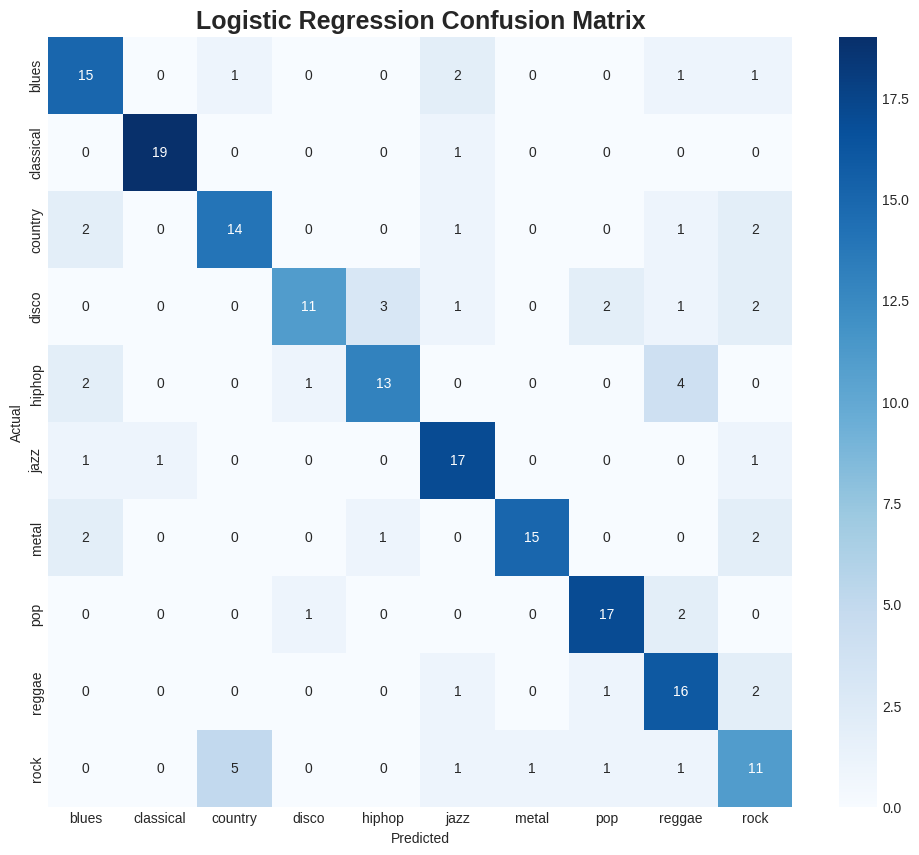

In [ ]:
from sklearn.linear_model import LogisticRegression

from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix
)

# Logistic Regression model
lr_model = LogisticRegression(
    max_iter=5000,
    random_state=42
)

# Train model
lr_model.fit(
    X_train_scaled,
    y_train
)

# Predictions
lr_pred = lr_model.predict(
    X_test_scaled
)

# Evaluation
lr_acc = accuracy_score(
    y_test,
    lr_pred
)

print("Logistic Regression Accuracy:")
print(lr_acc)

print("\nClassification Report:\n")

print(
    classification_report(
        y_test,
        lr_pred,
        target_names=encoder.classes_
    )
)

# Confusion matrix
cm = confusion_matrix(
    y_test,
    lr_pred
)

plt.figure(figsize=(12,10))

sns.heatmap(
    cm,
    annot=True,
    fmt='d',
    cmap='Blues',
    xticklabels=encoder.classes_,
    yticklabels=encoder.classes_
)

plt.title(
    "Logistic Regression Confusion Matrix",
    fontsize=18,
    fontweight='bold'
)

plt.xlabel("Predicted")
plt.ylabel("Actual")

plt.show()

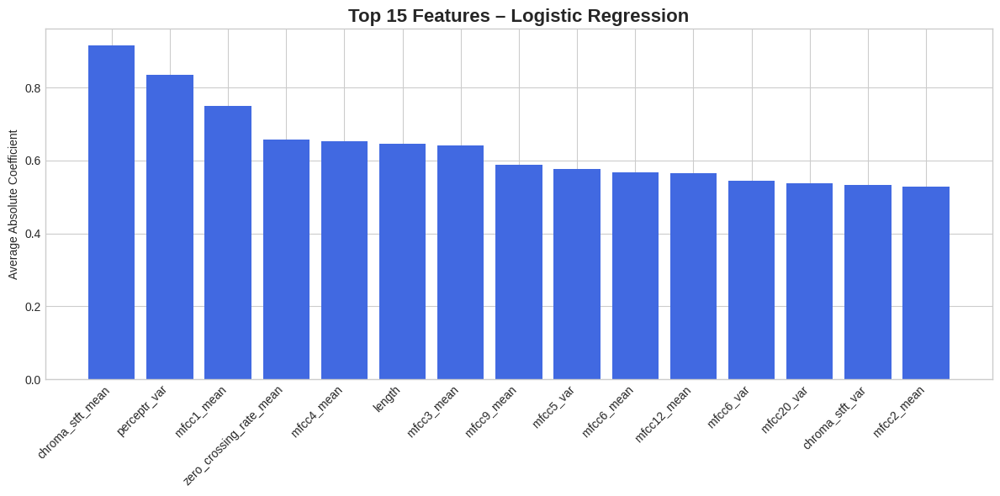

In [ ]:
original_feature_columns_for_lr = df.drop(['filename', 'label'], axis=1).columns

lr_importances = np.abs(
    lr_model.coef_
).mean(axis=0)

idx_lr = np.argsort(
    lr_importances
)[::-1][:15]

plt.figure(figsize=(12,6))

plt.bar(
    range(15),
    lr_importances[idx_lr],
    color='royalblue'
)

plt.xticks(
    range(15),
    [original_feature_columns_for_lr[i] for i in idx_lr],
    rotation=45,
    ha='right'
)

plt.title(
    "Top 15 Features – Logistic Regression",
    fontsize=16,
    fontweight='bold'
)

plt.ylabel(
    "Average Absolute Coefficient"
)

plt.tight_layout()

plt.show()

## Comparaciones rendimiento modelos

In [ ]:
# Accuracy comparison

# Random Forest accuracy
rf_acc = accuracy_score(
    y_test,
    rf_best.predict(X_test)
)

comparison_df = pd.DataFrame({
    'Model': [
        'Logistic Regression',
        'Naive Bayes',
        'Decision Tree',
        'Random Forest',
        'XGBoost'
    ],
    'Accuracy': [
        lr_acc,
        nb_acc,
        dt_acc,
        rf_acc,
        xgb_acc
    ]
})

comparison_df = comparison_df.sort_values(
    by='Accuracy',
    ascending=False
)

/tmp/ipykernel_11655/2317987847.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


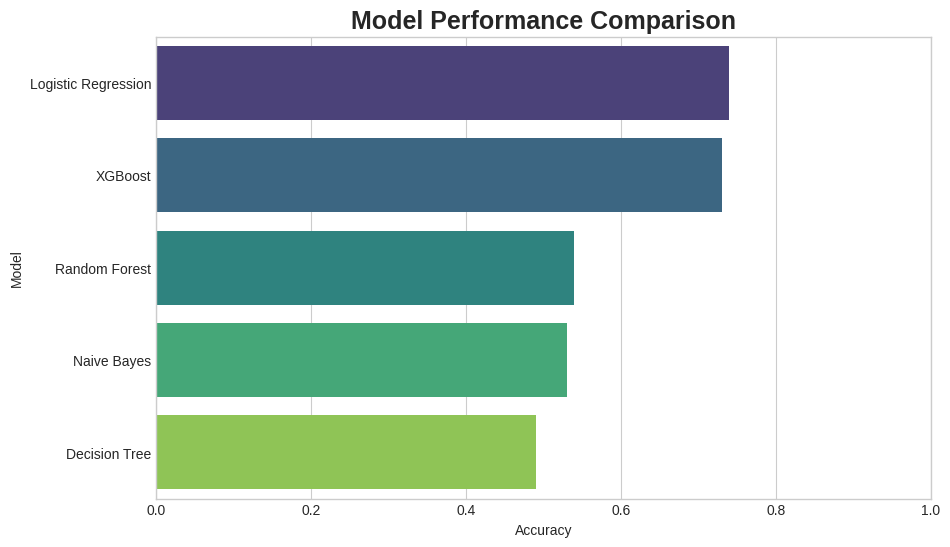

In [ ]:
plt.figure(figsize=(10,6))

sns.barplot(
    data=comparison_df,
    x='Accuracy',
    y='Model',
    palette='viridis'
)

plt.xlim(0,1)

plt.title(
    "Model Performance Comparison",
    fontsize=18,
    fontweight='bold'
)

plt.xlabel("Accuracy")
plt.ylabel("Model")

plt.show()

## **Extracción real de audio**

In [ ]:
!pip install pydub

In [ ]:
!pip install rarfile

In [ ]:
import librosa
import librosa.display

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import rarfile

In [ ]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import rarfile

rar_path = "/content/drive/MyDrive/genres_original.rar"

with rarfile.RarFile(rar_path) as rf:

    rf.extractall()

print("RAR extracted successfully!")

RAR extracted successfully!


In [ ]:
import os

os.listdir("genres_original")

['classical',
 'pop',
 'country',
 'blues',
 'disco',
 'rock',
 'metal',
 'reggae',
 'hiphop',
 'jazz']

In [ ]:
dataset_path = "genres_original"

In [ ]:
def extract_features(file_path):

    y, sr = librosa.load(
        file_path,
        duration=30
    )

    features = {}

    # Chroma
    chroma_stft = librosa.feature.chroma_stft(
        y=y,
        sr=sr
    )

    features['chroma_stft_mean'] = np.mean(chroma_stft)
    features['chroma_stft_var'] = np.var(chroma_stft)

    # RMS
    rms = librosa.feature.rms(y=y)

    features['rms_mean'] = np.mean(rms)
    features['rms_var'] = np.var(rms)

    # Spectral centroid
    spectral_centroid = librosa.feature.spectral_centroid(
        y=y,
        sr=sr
    )

    features['spectral_centroid_mean'] = np.mean(spectral_centroid)
    features['spectral_centroid_var'] = np.var(spectral_centroid)

    # Spectral bandwidth
    spectral_bandwidth = librosa.feature.spectral_bandwidth(
        y=y,
        sr=sr
    )

    features['spectral_bandwidth_mean'] = np.mean(spectral_bandwidth)
    features['spectral_bandwidth_var'] = np.var(spectral_bandwidth)

    # Rolloff
    rolloff = librosa.feature.spectral_rolloff(
        y=y,
        sr=sr
    )

    features['rolloff_mean'] = np.mean(rolloff)
    features['rolloff_var'] = np.var(rolloff)

    # Zero crossing rate
    zcr = librosa.feature.zero_crossing_rate(y)

    features['zero_crossing_rate_mean'] = np.mean(zcr)
    features['zero_crossing_rate_var'] = np.var(zcr)

    # Harmony
    harmony = librosa.effects.harmonic(y)

    features['harmony_mean'] = np.mean(harmony)
    features['harmony_var'] = np.var(harmony)

    # Spectral contrast
    perceptr = librosa.feature.spectral_contrast(
        y=y,
        sr=sr
    )

    features['perceptr_mean'] = np.mean(perceptr)
    features['perceptr_var'] = np.var(perceptr)

    # Tempo
    tempo, _ = librosa.beat.beat_track(
        y=y,
        sr=sr
    )

    features['tempo'] = tempo

    # MFCCs
    mfccs = librosa.feature.mfcc(
        y=y,
        sr=sr,
        n_mfcc=20
    )

    for i in range(20):

        features[f'mfcc{i+1}_mean'] = np.mean(mfccs[i])

        features[f'mfcc{i+1}_var'] = np.var(mfccs[i])

    return features

In [ ]:
dataset_path = "genres_original"

data = []

genres = os.listdir(dataset_path)

for genre in genres:

    genre_path = os.path.join(
        dataset_path,
        genre
    )

    if not os.path.isdir(genre_path):
        continue

    print(f"Processing {genre}...")

    for file_name in os.listdir(genre_path):

        file_path = os.path.join(
            genre_path,
            file_name
        )

        try:

            features = extract_features(
                file_path
            )

            features['label'] = genre

            data.append(features)

        except Exception as e:

            print(
                f"Error processing {file_name}: {e}"
            )

Processing classical...
Processing pop...
Processing country...
Processing blues...
Processing disco...
Processing rock...
Processing metal...
Processing reggae...
Processing hiphop...
Processing jazz...


/tmp/ipykernel_470/2953785797.py:3: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(
/usr/local/lib/python3.12/dist-packages/librosa/core/audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


Error processing jazz.00054.wav: 


In [ ]:
df_generated = pd.read_excel("music_features_generated.xlsx")

df_generated.head()

,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,0.219034,0.084554,0.016752,0.000314,811.996675,50399.093422,1009.409531,74436.573959,1236.309191,2.634693e+05,...,62.38335,-5.324365,98.55278,1.263561,127.600945,1.879790,71.294266,-1.657989,83.289690,classical
1,0.253850,0.088758,0.016770,0.000092,1751.730267,388416.324702,1930.492879,182027.309080,3236.655428,2.037408e+06,...,101.86245,-1.275358,56.03847,-2.505180,97.182270,-2.569393,208.952010,-4.069762,152.084810,classical
2,0.277848,0.083744,0.043841,0.000192,1490.014795,38966.969361,1599.803415,31208.918822,2784.949826,2.748407e+05,...,84.83797,-1.314238,77.07162,2.931815,74.025780,-1.668387,59.243156,-2.899859,53.042133,classical
3,0.219335,0.086257,0.023854,0.000107,2172.514739,132960.082830,1883.380392,41802.727419,4066.958741,5.080459e+05,...,120.91340,9.963878,92.14962,9.199149,105.929640,2.789936,125.704094,-5.384016,210.741030,classical
4,0.239109,0.084647,0.018668,0.000320,1158.001203,187848.912568,1320.978924,148934.256288,2182.003472,9.293701e+05,...,76.49732,1.527922,69.53462,-2.260288,86.594810,-1.447285,106.026910,2.610209,163.696550,classical


In [ ]:
print(df_generated.shape)

(999, 58)


In [ ]:
df_generated.to_csv(
    "/content/drive/MyDrive/music_features_generated.csv",
    index=False
)

print("Dataset saved successfully!")

Dataset saved successfully!


## Entrenamiento 3 modelos con nuevo dataset

In [ ]:
X = df_generated.drop(
    ['label'],
    axis=1
)

y = df_generated['label']

## Training

In [ ]:
for col in df_generated.columns:
    if df_generated[col].dtype == 'object':
        print(col)

tempo
label


In [ ]:
import ast

df_generated["tempo"] = df_generated["tempo"].apply(
    lambda x: ast.literal_eval(x)[0]
    if isinstance(x, str)
    else x
)

In [ ]:
df_generated["tempo"].head()

,tempo
0,161.499023
1,107.666016
2,99.384014
3,95.703125
4,161.499023


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler

# Features y target
X = df_generated.drop(
    columns=['label']
)

y = df_generated['label']

# Encoding
encoder = LabelEncoder()

y_encoded = encoder.fit_transform(y)

# Split
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y_encoded,
    test_size=0.2,
    random_state=42,
    stratify=y_encoded
)

# Escalamiento
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(
    X_train
)

X_test_scaled = scaler.transform(
    X_test
)

print(X_train.shape)
print(X_test.shape)

(799, 57)
(200, 57)


### Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf_model = RandomForestClassifier(
    n_estimators=300,
    max_depth=20,
    random_state=42,
    n_jobs=-1
)

rf_model.fit(
    X_train,
    y_train
)

rf_pred = rf_model.predict(
    X_test
)

rf_acc = accuracy_score(
    y_test,
    rf_pred
)

print("Random Forest Accuracy:")
print(rf_acc)

print(
    classification_report(
        y_test,
        rf_pred,
        target_names=encoder.classes_
    )
)

Random Forest Accuracy:
0.73
              precision    recall  f1-score   support

       blues       0.62      0.80      0.70        20
   classical       1.00      0.90      0.95        20
     country       0.64      0.45      0.53        20
       disco       0.67      0.70      0.68        20
      hiphop       0.78      0.70      0.74        20
        jazz       0.86      0.95      0.90        20
       metal       0.74      0.85      0.79        20
         pop       0.81      0.65      0.72        20
      reggae       0.62      0.75      0.68        20
        rock       0.61      0.55      0.58        20

    accuracy                           0.73       200
   macro avg       0.74      0.73      0.73       200
weighted avg       0.74      0.73      0.73       200



## XGBOOST

In [ ]:
import xgboost as xgb

xgb_model = xgb.XGBClassifier(
    objective='multi:softmax',
    num_class=len(encoder.classes_),
    n_estimators=200,
    max_depth=6,
    learning_rate=0.05,
    subsample=0.8,
    colsample_bytree=0.8,
    eval_metric='mlogloss',
    random_state=42
)

xgb_model.fit(
    X_train,
    y_train
)

xgb_pred = xgb_model.predict(
    X_test
)

xgb_acc = accuracy_score(
    y_test,
    xgb_pred
)

print("XGBoost Accuracy:")
print(xgb_acc)

print(
    classification_report(
        y_test,
        xgb_pred,
        target_names=encoder.classes_
    )
)

XGBoost Accuracy:
0.735
              precision    recall  f1-score   support

       blues       0.65      0.85      0.74        20
   classical       1.00      0.85      0.92        20
     country       0.71      0.60      0.65        20
       disco       0.71      0.85      0.77        20
      hiphop       0.71      0.60      0.65        20
        jazz       0.82      0.90      0.86        20
       metal       0.81      0.85      0.83        20
         pop       0.93      0.70      0.80        20
      reggae       0.65      0.75      0.70        20
        rock       0.44      0.40      0.42        20

    accuracy                           0.73       200
   macro avg       0.74      0.73      0.73       200
weighted avg       0.74      0.73      0.73       200



## Logistic Reggression

In [ ]:
from sklearn.linear_model import LogisticRegression

from sklearn.metrics import (
    accuracy_score,
    classification_report
)

lr_model = LogisticRegression(
    max_iter=5000,
    random_state=42
)

lr_model.fit(
    X_train_scaled,
    y_train
)

lr_pred = lr_model.predict(
    X_test_scaled
)

lr_acc = accuracy_score(
    y_test,
    lr_pred
)

print("Logistic Regression Accuracy:")
print(lr_acc)

print(
    classification_report(
        y_test,
        lr_pred,
        target_names=encoder.classes_
    )
)

Logistic Regression Accuracy:
0.715
              precision    recall  f1-score   support

       blues       0.65      0.85      0.74        20
   classical       1.00      0.90      0.95        20
     country       0.65      0.55      0.59        20
       disco       0.78      0.70      0.74        20
      hiphop       0.50      0.45      0.47        20
        jazz       0.89      0.80      0.84        20
       metal       0.64      0.80      0.71        20
         pop       0.87      0.65      0.74        20
      reggae       0.67      0.80      0.73        20
        rock       0.62      0.65      0.63        20

    accuracy                           0.71       200
   macro avg       0.73      0.72      0.71       200
weighted avg       0.73      0.71      0.71       200



## Comparación

In [ ]:
comparison_df = pd.DataFrame({
    'Model': [
        'Logistic Regression',
        'Random Forest',
        'XGBoost'
    ],
    'Accuracy': [
        lr_acc,
        rf_acc,
        xgb_acc
    ]
})

comparison_df = comparison_df.sort_values(
    by='Accuracy',
    ascending=False
)

comparison_df

,Model,Accuracy
2,XGBoost,0.735
1,Random Forest,0.730
0,Logistic Regression,0.715


/tmp/ipykernel_11655/2267282316.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


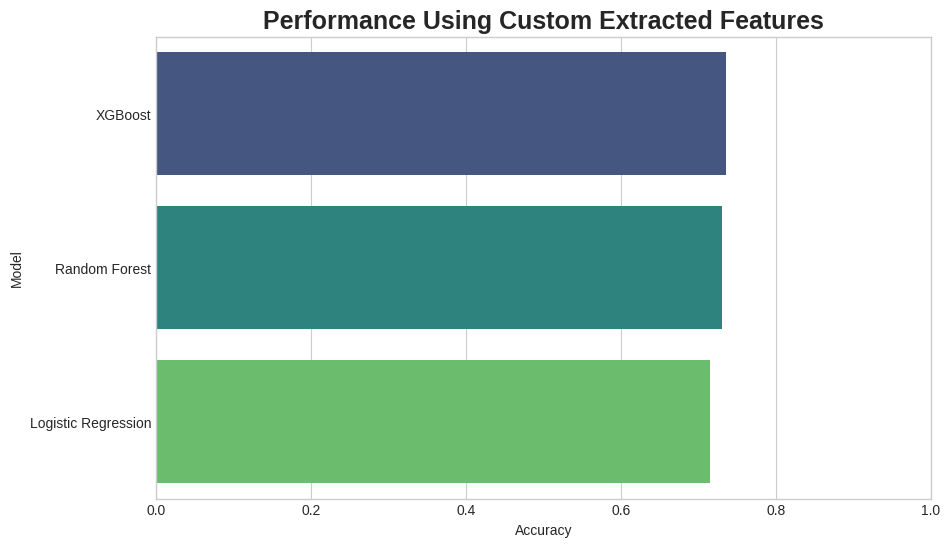

In [ ]:
plt.figure(figsize=(10,6))

sns.barplot(
    data=comparison_df,
    x='Accuracy',
    y='Model',
    palette='viridis'
)

plt.xlim(0,1)

plt.title(
    "Performance Using Custom Extracted Features",
    fontsize=18,
    fontweight='bold'
)

plt.xlabel("Accuracy")
plt.ylabel("Model")

plt.show()

In [ ]:
import joblib

joblib.dump(
    lr_model,
    "lr_model_custom.pkl"
)

joblib.dump(
    rf_model,
    "rf_model_custom.pkl"
)

joblib.dump(
    xgb_model,
    "xgb_model_custom.pkl"
)

joblib.dump(
    scaler,
    "scaler_custom.pkl"
)

joblib.dump(
    encoder,
    "encoder_custom.pkl"
)

['encoder_custom.pkl']

## Predicción

In [ ]:
def predict_song_genre(file_path):

    features = extract_features(
        file_path
    )

    features_df = pd.DataFrame(
        [features]
    )


    features_df = features_df.reindex(
        columns=X.columns,
        fill_value=0
    )


    features_df = features_df.astype(float)

    # Logistic Regression usa escalamiento
    scaled_features = scaler.transform(
        features_df
    )

    predictions = {

        "Logistic Regression":
        encoder.inverse_transform(
            lr_model.predict(
                scaled_features
            )
        )[0],

        "Random Forest":
        encoder.inverse_transform(
            rf_model.predict(
                features_df
            )
        )[0],

        "XGBoost":
        encoder.inverse_transform(
            xgb_model.predict(
                features_df
            )
        )[0]
    }

    return predictions

## Predicción

In [ ]:
from collections import Counter
import librosa
import librosa.display
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

def predict_song(file_path):



    y, sr = librosa.load(
        file_path,
        duration=30
    )

    fig, axes = plt.subplots(
        2,
        1,
        figsize=(14,8)
    )

    # Waveform
    librosa.display.waveshow(
        y,
        sr=sr,
        ax=axes[0]
    )

    axes[0].set_title(
        "Waveform",
        fontsize=14,
        fontweight='bold'
    )

    # Spectrogram
    D = librosa.amplitude_to_db(
        np.abs(librosa.stft(y)),
        ref=np.max
    )

    librosa.display.specshow(
        D,
        sr=sr,
        x_axis='time',
        y_axis='log',
        cmap='magma',
        ax=axes[1]
    )

    axes[1].set_title(
        "Spectrogram",
        fontsize=14,
        fontweight='bold'
    )

    plt.tight_layout()
    plt.show()



    predictions = predict_song_genre(
        file_path
    )


    weights = {
        'Logistic Regression': lr_acc,
        'Random Forest': rf_acc,
        'XGBoost': xgb_acc
    }

    genre_scores = {}

    for model, genre in predictions.items():

        genre_scores[genre] = (
            genre_scores.get(genre, 0)
            + weights[model]
        )

    final_prediction = max(
        genre_scores,
        key=genre_scores.get
    )

    confidence = (
        genre_scores[final_prediction]
        /
        sum(genre_scores.values())
    )



    results_df = pd.DataFrame({
        "Model": [
            "Logistic Regression",
            "Random Forest",
            "XGBoost"
        ],
        "Prediction": [
            predictions["Logistic Regression"],
            predictions["Random Forest"],
            predictions["XGBoost"]
        ],
        "Accuracy": [
            round(lr_acc, 3),
            round(rf_acc, 3),
            round(xgb_acc, 3)
        ]
    })

    display(
        results_df.style
        .hide(axis="index")
        .background_gradient(
            subset=["Accuracy"],
            cmap="YlGn"
        )
        .set_caption(
            "Genre Prediction Results"
        )
    )

    print(
        f"\nFinal Prediction: {final_prediction.upper()}"
    )

    print(
        f"Confidence: {confidence:.2%}"
    )

    print(
        "\nGenre Scores:"
    )

    print(genre_scores)

    return (
        final_prediction,
        confidence,
        results_df
    )

## Ejemplos funcionamiento

In [ ]:
!pip install yt-dlp -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 182.3/182.3 kB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 14.0 MB/s eta 0:00:00


# Canción September Earth Wind & Fire (Disco)

In [ ]:
!yt-dlp -x \
--audio-format wav \
-o "%(title)s.%(ext)s" \
"https://youtu.be/Gs069dndIYk?si=kZhg5cCBuV8aQHVn"

[youtube] Extracting URL: https://youtu.be/Gs069dndIYk?si=kZhg5cCBuV8aQHVn
[youtube] Gs069dndIYk: Downloading webpage
[youtube] Gs069dndIYk: Downloading android vr player API JSON
[info] Gs069dndIYk: Downloading 1 format(s): 251
[download] Destination: Earth, Wind & Fire - September (Official HD Video).webm
[download] 100% of    3.38MiB in 00:00:00 at 41.97MiB/s
[ExtractAudio] Destination: Earth, Wind & Fire - September (Official HD Video).wav
Deleting original file Earth, Wind & Fire - September (Official HD Video).webm (pass -k to keep)


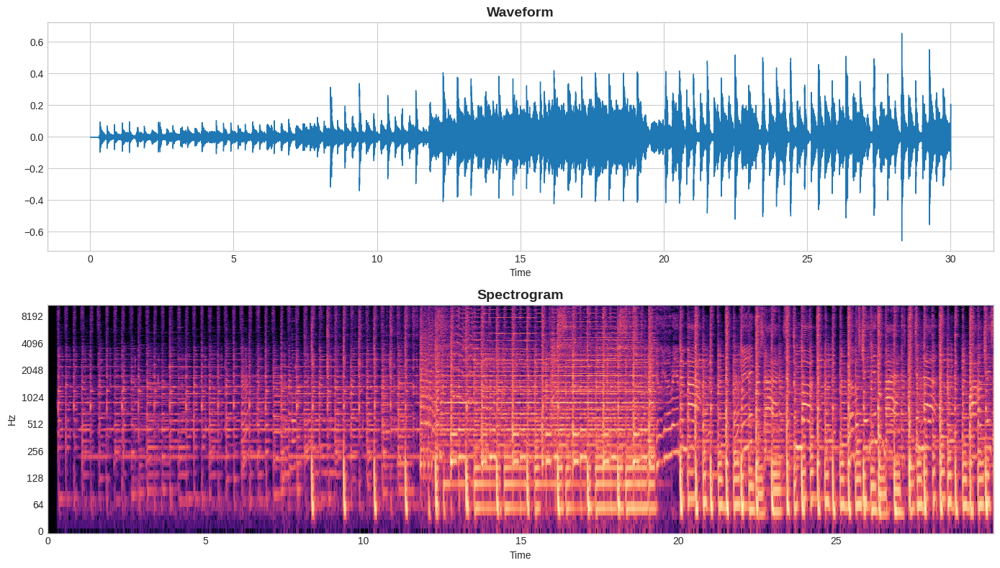

Model,Prediction,Accuracy
Logistic Regression,disco,0.715000
Random Forest,disco,0.730000
XGBoost,disco,0.735000



Final Prediction: DISCO
Confidence: 100.00%

Genre Scores:
{'disco': 2.1799999999999997}


('disco',
 1.0,
                  Model Prediction  Accuracy
 0  Logistic Regression      disco     0.715
 1        Random Forest      disco     0.730
 2              XGBoost      disco     0.735)

In [ ]:
song_path = "Earth, Wind & Fire - September (Official HD Video).wav"

predict_song(
    song_path
)

## Canción Oppenheimer (Clásico)

In [ ]:
!yt-dlp -x \
--audio-format wav \
-o "%(title)s.%(ext)s" \
"https://youtu.be/4JZ-o3iAJv4?si=zQwaz-jGpbovFs-Z"

[youtube] Extracting URL: https://youtu.be/4JZ-o3iAJv4?si=zQwaz-jGpbovFs-Z
[youtube] 4JZ-o3iAJv4: Downloading webpage
[youtube] 4JZ-o3iAJv4: Downloading android vr player API JSON
[info] 4JZ-o3iAJv4: Downloading 1 format(s): 251
[download] Can You Hear The Music.wav has already been downloaded
[ExtractAudio] Destination: Can You Hear The Music.wav
Deleting original file Can You Hear The Music.orig.wav (pass -k to keep)


In [ ]:
import os

wav_files = [f for f in os.listdir() if f.endswith(".wav")]

print(wav_files)

['Carly Rae Jepsen ＂Call Me Maybe＂ (Official Audio).wav', 'Can You Hear The Music.wav', 'Earth, Wind & Fire - September (Official HD Video).wav', 'FRIENDS Intro Video [HD] ｜ With On Screen Lyrics.wav', 'TVアニメ「進撃の巨人」The Final Season Part 2ノンクレジットOP ｜SiM「The Rumbling」.wav']


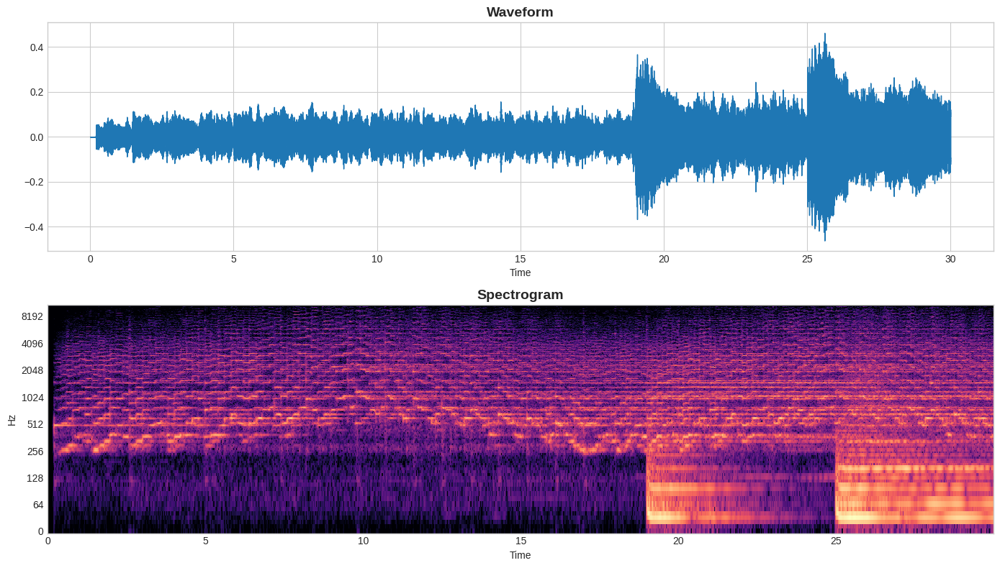

Model,Prediction,Accuracy
Logistic Regression,classical,0.715000
Random Forest,classical,0.730000
XGBoost,classical,0.735000



Final Prediction: CLASSICAL
Confidence: 100.00%

Genre Scores:
{'classical': 2.1799999999999997}


('classical',
 1.0,
                  Model Prediction  Accuracy
 0  Logistic Regression  classical     0.715
 1        Random Forest  classical     0.730
 2              XGBoost  classical     0.735)

In [ ]:
song_path = "Can You Hear The Music.wav"

predict_song(
    song_path
)

## Canción - Welcome To The Jungle - Guns n´ Roses (Rock)

In [ ]:
!yt-dlp -x \
--audio-format wav \
-o "%(title)s.%(ext)s" \
"https://youtu.be/CVVRdFuveW0?si=fbDAPyWyrbOylGfw"

[youtube] Extracting URL: https://youtu.be/CVVRdFuveW0?si=fbDAPyWyrbOylGfw
[youtube] CVVRdFuveW0: Downloading webpage
[youtube] CVVRdFuveW0: Downloading android vr player API JSON
[info] CVVRdFuveW0: Downloading 1 format(s): 251
[download] Destination: Guns N' Roses - Welcome To The Jungle.webm
[download] 100% of    4.03MiB in 00:00:00 at 6.32MiB/s
[ExtractAudio] Destination: Guns N' Roses - Welcome To The Jungle.wav
Deleting original file Guns N' Roses - Welcome To The Jungle.webm (pass -k to keep)


In [ ]:
import os

wav_files = [f for f in os.listdir() if f.endswith(".wav")]

print(wav_files)

['Carly Rae Jepsen ＂Call Me Maybe＂ (Official Audio).wav', 'Can You Hear The Music.wav', 'Earth, Wind & Fire - September (Official HD Video).wav', 'FRIENDS Intro Video [HD] ｜ With On Screen Lyrics.wav', 'TVアニメ「進撃の巨人」The Final Season Part 2ノンクレジットOP ｜SiM「The Rumbling」.wav', "Guns N' Roses - Welcome To The Jungle.wav"]


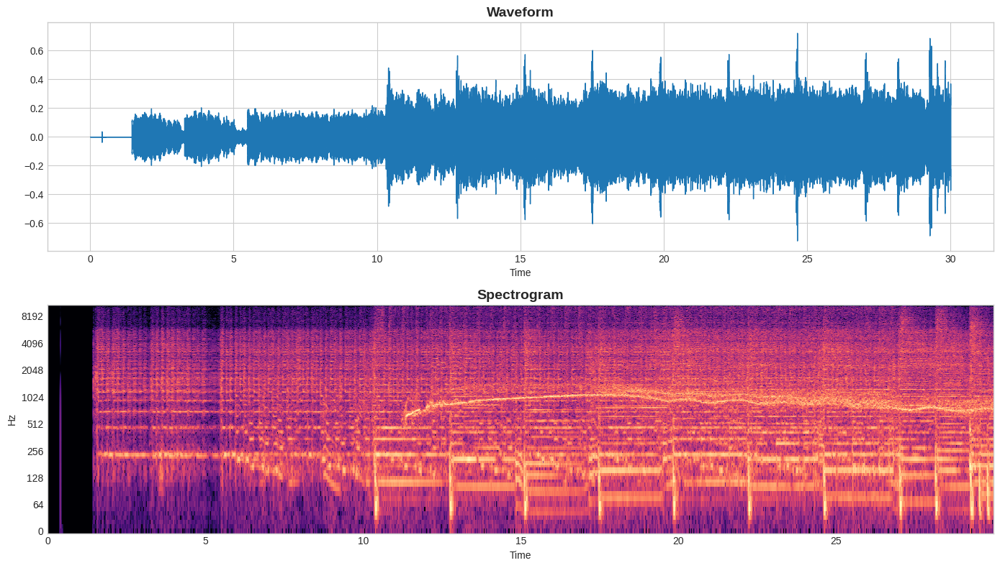

Model,Prediction,Accuracy
Logistic Regression,metal,0.715000
Random Forest,rock,0.730000
XGBoost,rock,0.735000



Final Prediction: ROCK
Confidence: 67.20%

Genre Scores:
{'metal': 0.715, 'rock': 1.4649999999999999}


('rock',
 0.6720183486238532,
                  Model Prediction  Accuracy
 0  Logistic Regression      metal     0.715
 1        Random Forest       rock     0.730
 2              XGBoost       rock     0.735)

In [ ]:
song_path = "Guns N' Roses - Welcome To The Jungle.wav"

predict_song(
    song_path
)

## Canción The Rumbling - Attack On Titan (METAL)

In [ ]:
!yt-dlp -x \
--audio-format wav \
-o "%(title)s.%(ext)s" \
"https://youtu.be/rfU8sPLkcSE?si=bdLg5kiMqhfTJ6oD"

[youtube] Extracting URL: https://youtu.be/rfU8sPLkcSE?si=bdLg5kiMqhfTJ6oD
[youtube] rfU8sPLkcSE: Downloading webpage
[youtube] rfU8sPLkcSE: Downloading android vr player API JSON
[info] rfU8sPLkcSE: Downloading 1 format(s): 251
[download] FRIENDS Intro Video [HD] ｜ With On Screen Lyrics.wav has already been downloaded
[ExtractAudio] Destination: FRIENDS Intro Video [HD] ｜ With On Screen Lyrics.wav
Deleting original file FRIENDS Intro Video [HD] ｜ With On Screen Lyrics.orig.wav (pass -k to keep)


In [ ]:
import os

wav_files = [f for f in os.listdir() if f.endswith(".wav")]

print(wav_files)

['Carly Rae Jepsen ＂Call Me Maybe＂ (Official Audio).wav', 'Can You Hear The Music.wav', 'Earth, Wind & Fire - September (Official HD Video).wav', 'FRIENDS Intro Video [HD] ｜ With On Screen Lyrics.wav']


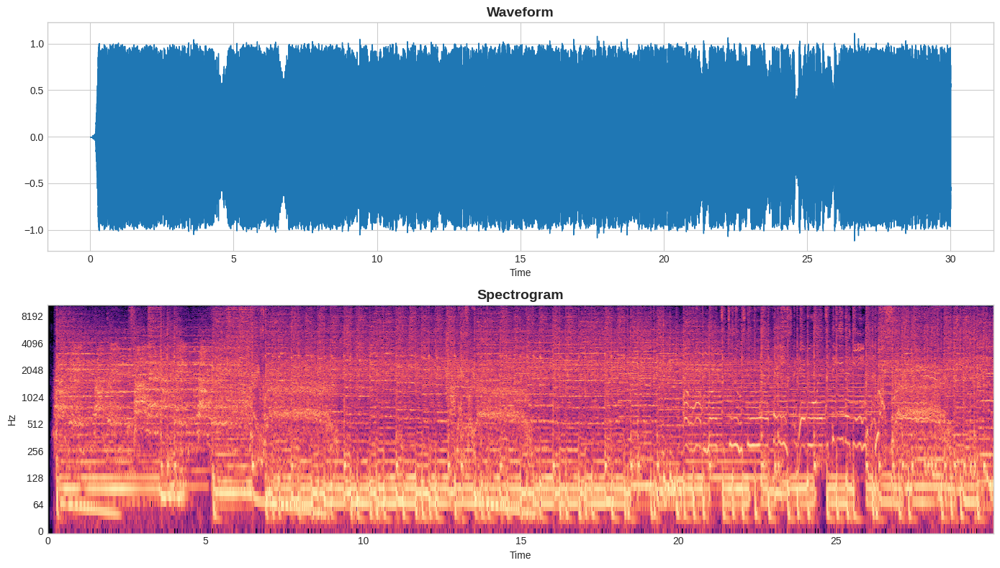

Model,Prediction,Accuracy
Logistic Regression,metal,0.715000
Random Forest,metal,0.730000
XGBoost,metal,0.735000



Final Prediction: METAL
Confidence: 100.00%

Genre Scores:
{'metal': 2.1799999999999997}


('metal',
 1.0,
                  Model Prediction  Accuracy
 0  Logistic Regression      metal     0.715
 1        Random Forest      metal     0.730
 2              XGBoost      metal     0.735)

In [ ]:
song_path = "TVアニメ「進撃の巨人」The Final Season Part 2ノンクレジットOP ｜SiM「The Rumbling」.wav"

predict_song(
    song_path
)

## Canción Without Me - EMINEM (HipHop)

In [ ]:
!yt-dlp -x \
--audio-format wav \
-o "%(title)s.%(ext)s" \
"https://youtu.be/pyb13N80DZQ?si=z5fMTLP_XhaPPGyw"



[youtube] Extracting URL: https://youtu.be/pyb13N80DZQ?si=z5fMTLP_XhaPPGyw
[youtube] pyb13N80DZQ: Downloading webpage
[youtube] pyb13N80DZQ: Downloading android vr player API JSON
[info] pyb13N80DZQ: Downloading 1 format(s): 251
[download] Destination: Eminem - Without Me (Audio).webm
[download] 100% of    4.49MiB in 00:00:00 at 25.04MiB/s
[ExtractAudio] Destination: Eminem - Without Me (Audio).wav
Deleting original file Eminem - Without Me (Audio).webm (pass -k to keep)


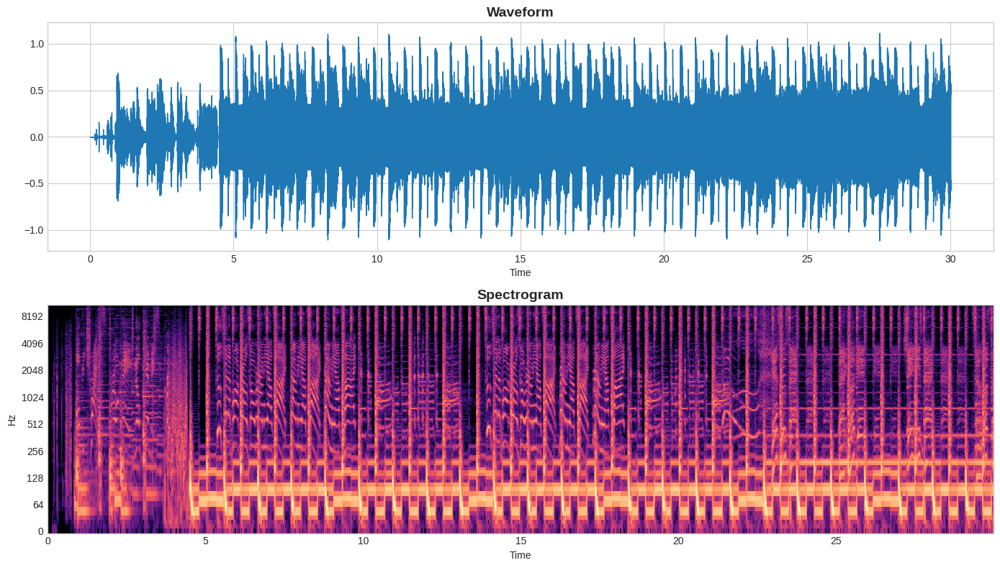

Model,Prediction,Accuracy
Logistic Regression,reggae,0.715000
Random Forest,hiphop,0.730000
XGBoost,hiphop,0.735000



Final Prediction: HIPHOP
Confidence: 67.20%

Genre Scores:
{'reggae': 0.715, 'hiphop': 1.4649999999999999}


('hiphop',
 0.6720183486238532,
                  Model Prediction  Accuracy
 0  Logistic Regression     reggae     0.715
 1        Random Forest     hiphop     0.730
 2              XGBoost     hiphop     0.735)

In [ ]:
song_path = "Eminem - Without Me (Audio).wav"

predict_song(
    song_path
)

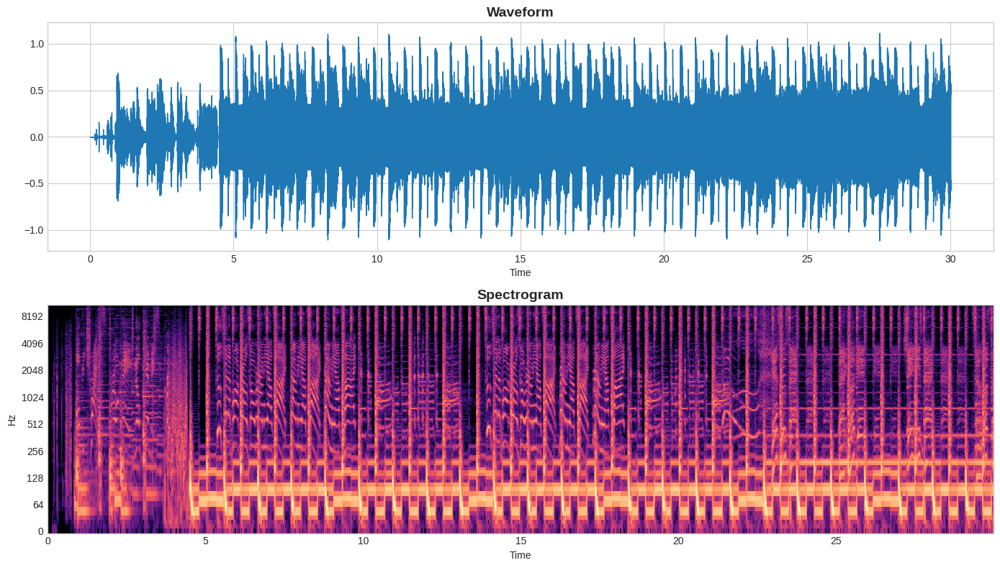

Model,Prediction,Accuracy
Logistic Regression,reggae,0.715000
Random Forest,hiphop,0.730000
XGBoost,hiphop,0.735000



Final Prediction: HIPHOP
Confidence: 67.20%

Genre Scores:
{'reggae': 0.715, 'hiphop': 1.4649999999999999}


('hiphop',
 0.6720183486238532,
                  Model Prediction  Accuracy
 0  Logistic Regression     reggae     0.715
 1        Random Forest     hiphop     0.730
 2              XGBoost     hiphop     0.735)

In [ ]:
song_path = "Eminem - Without Me (Audio).wav"

predict_song(
    song_path
)

## Canción Could You Be Loved - Bob Marley & The Wailers (Reggae)

In [ ]:
!yt-dlp -x \
--audio-format wav \
-o "%(title)s.%(ext)s" \
"https://youtu.be/1ti2YCFgCoI?si=1Vo3TsT6OzRHmfLA"




[youtube] Extracting URL: https://youtu.be/1ti2YCFgCoI?si=1Vo3TsT6OzRHmfLA
[youtube] 1ti2YCFgCoI: Downloading webpage
[youtube] 1ti2YCFgCoI: Downloading android vr player API JSON
[info] 1ti2YCFgCoI: Downloading 1 format(s): 251
[download] Destination: Bob Marley & The Wailers - Could You Be Loved (Official Music Video).webm
[download] 100% of    3.93MiB in 00:00:00 at 46.74MiB/s
[ExtractAudio] Destination: Bob Marley & The Wailers - Could You Be Loved (Official Music Video).wav
Deleting original file Bob Marley & The Wailers - Could You Be Loved (Official Music Video).webm (pass -k to keep)


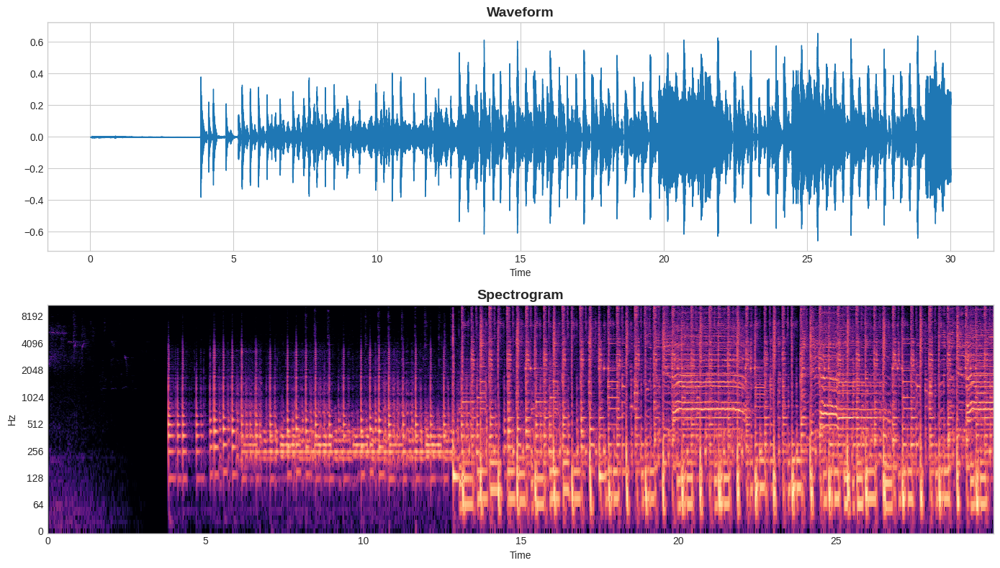

Model,Prediction,Accuracy
Logistic Regression,rock,0.715000
Random Forest,reggae,0.730000
XGBoost,reggae,0.735000



Final Prediction: REGGAE
Confidence: 67.20%

Genre Scores:
{'rock': 0.715, 'reggae': 1.4649999999999999}


('reggae',
 0.6720183486238532,
                  Model Prediction  Accuracy
 0  Logistic Regression       rock     0.715
 1        Random Forest     reggae     0.730
 2              XGBoost     reggae     0.735)

In [ ]:
song_path = "Bob Marley & The Wailers - Could You Be Loved (Official Music Video).wav"

predict_song(
    song_path
)